<a href="https://colab.research.google.com/github/assumption01/ML-and-DL-Projects/blob/main/studentperformance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Curbing the Risk of Student’s Failure at An Early Academic Path: A Machine Learning Approach

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Dataset was Retrieved from https://archive-beta.ics.uci.edu/api/static/ml/datasets/697/,

Platform: UC Irvine Machine Learning Repository,

Title: Predict students' dropout and academic success

# Data Preprocessing

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split

In [ ]:
#Read the data.csv from local machine
data = pd.read_csv('dataset/data.csv', sep=';')
data.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


In [ ]:
#Dataset records and columns
data.shape

(4424, 37)

In [ ]:
#Dataset labels
data.columns

Index(['Marital status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance\t', 'Previous qualification',
       'Previous qualification (grade)', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Admission grade',
       'Displaced', 'Educational special needs', 'Debtor',
       'Tuition fees up to date', 'Gender', 'Scholarship holder',
       'Age at enrollment', 'International',
       'Curricular units 1st sem (credited)',
       'Curricular units 1st sem (enrolled)',
       'Curricular units 1st sem (evaluations)',
       'Curricular units 1st sem (approved)',
       'Curricular units 1st sem (grade)',
       'Curricular units 1st sem (without evaluations)',
       'Curricular units 2nd sem (credited)',
       'Curricular units 2nd sem (enrolled)',
       'Curricular units 2nd sem (evaluations)',
       'Curricular units 2nd sem (approved)',
       'Curricular units 2nd

In [ ]:
#calculating some statistical data like percentile, mean and std of the numerical values of the DataFrame
data.describe()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,...,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,...,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,...,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,...,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,...,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,...,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,...,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


Correlation is a statistical technique that shows how two variables are related. Pandas dataframe.corr() method was used for creating the correlation matrix. It is used to find the pairwise correlation of all columns in the dataframe. Any na values are automatically excluded. For any non-numeric data type columns in the dataframe it is ignored.

In [ ]:
#correlation matrix
data.corr()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance\t,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
Marital status,1.000000,0.264006,-0.125854,0.046365,-0.274939,0.062529,-0.022406,-0.008843,0.193163,0.130353,...,0.034711,0.062831,0.039026,0.022784,-0.043739,-0.071506,0.020426,-0.020338,0.008761,-0.027003
Application mode,0.264006,1.000000,-0.286357,0.065385,-0.304092,0.422411,-0.039020,-0.000661,0.118974,0.083276,...,0.045828,0.238445,0.130046,0.167872,-0.071526,-0.115424,0.047983,0.089080,-0.016375,-0.022743
Application order,-0.125854,-0.286357,1.000000,0.059507,0.158657,-0.184315,-0.064484,-0.022416,-0.064956,-0.050288,...,-0.031699,-0.125815,0.028878,-0.055089,0.071793,0.055517,-0.015757,-0.098419,-0.011133,0.030201
Course,0.046365,0.065385,0.059507,1.000000,-0.043151,0.006654,-0.081013,-0.033923,0.054543,0.050724,...,0.034514,-0.089817,0.401539,0.278797,0.198032,0.348728,0.030816,0.007153,0.017710,-0.020265
Daytime/evening attendance\t,-0.274939,-0.304092,0.158657,-0.043151,1.000000,-0.071871,0.052597,0.018530,-0.204767,-0.139894,...,0.045630,-0.111953,0.000371,0.014610,0.034022,0.050493,-0.004229,0.061974,-0.024043,0.022929
Previous qualification,0.062529,0.422411,-0.184315,0.006654,-0.071871,1.000000,0.104072,-0.029214,-0.013190,-0.006614,...,0.002887,0.143031,0.056179,0.114850,-0.008632,0.000942,0.005102,0.111958,-0.063736,0.064069
Previous qualification (grade),-0.022406,-0.039020,-0.064484,-0.081013,0.052597,0.104072,1.000000,0.054088,-0.060670,-0.035234,...,-0.003926,-0.018489,-0.031649,-0.061355,0.050263,0.053239,-0.019015,0.045222,0.018710,-0.052620
Nacionality,-0.008843,-0.000661,-0.022416,-0.033923,0.018530,-0.029214,0.054088,1.000000,-0.049946,-0.085282,...,0.009145,-0.007278,-0.020113,-0.025721,-0.017880,-0.008497,-0.014041,-0.000651,-0.008922,0.034478
Mother's qualification,0.193163,0.118974,-0.064956,0.054543,-0.204767,-0.013190,-0.060670,-0.049946,1.000000,0.535140,...,0.003183,0.042771,0.035150,0.021033,-0.014858,-0.031175,0.021305,-0.114351,0.059441,-0.083657
Father's qualification,0.130353,0.083276,-0.050288,0.050724,-0.139894,-0.006614,-0.035234,-0.085282,0.535140,1.000000,...,-0.017333,0.042666,0.024380,0.009514,0.005285,-0.008083,-0.007430,-0.077905,0.057633,-0.071610


C:\Users\mikelobe10\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
C:\Users\mikelobe10\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\utils.py:660: UserWarning: Glyph 9 (	) missing from current font.
  bboxes = [l.get_window_extent() for l in labels]
C:\Users\mikelobe10\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


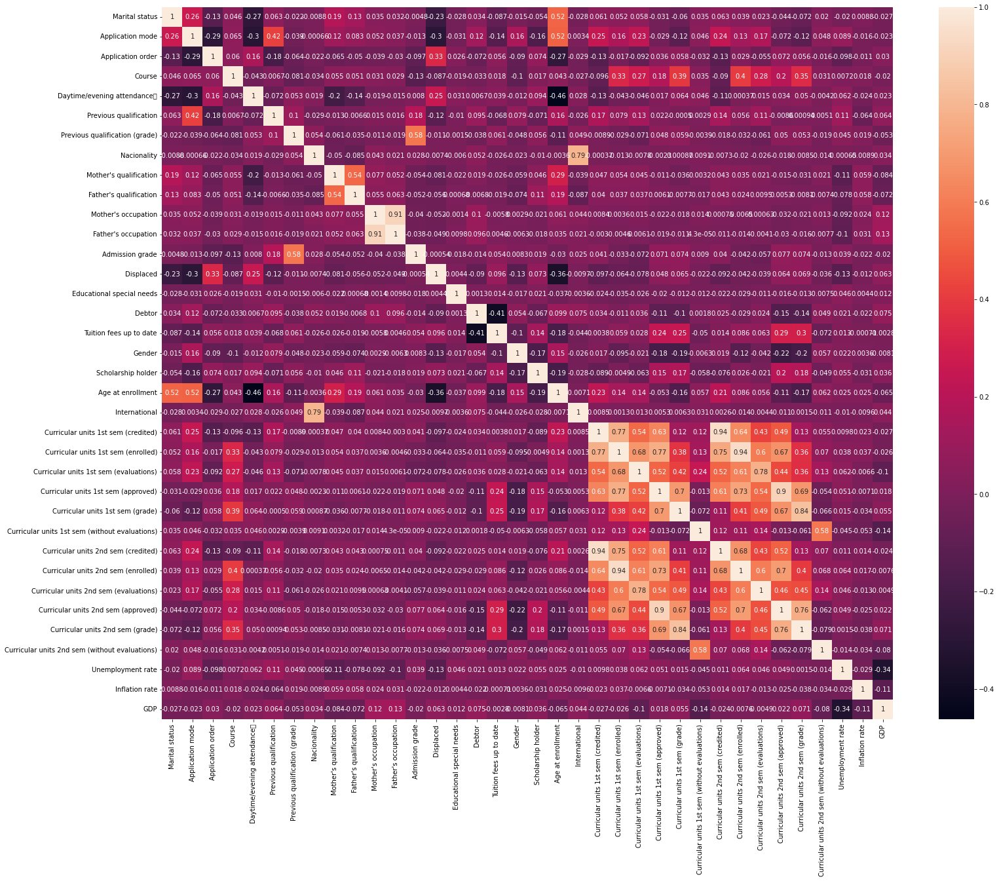

In [ ]:
#Using seaborn for much easier and better looking plot designs
import seaborn as sns

# Increase the size of the heatmap.
fig_dims = (25, 20)
fig, ax = plt.subplots(figsize=fig_dims)
sns_plot = sns.heatmap(data.corr(), ax = ax, annot=True, cmap='rocket')

C:\Users\mikelobe10\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Glyph 9 (	) missing from current font.
  self._figure.tight_layout(*args, **kwargs)
C:\Users\mikelobe10\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
C:\Users\mikelobe10\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Glyph 9 (	) missing from current font.
  self._figure.tight_layout(*args, **kwargs)


C:\Users\mikelobe10\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


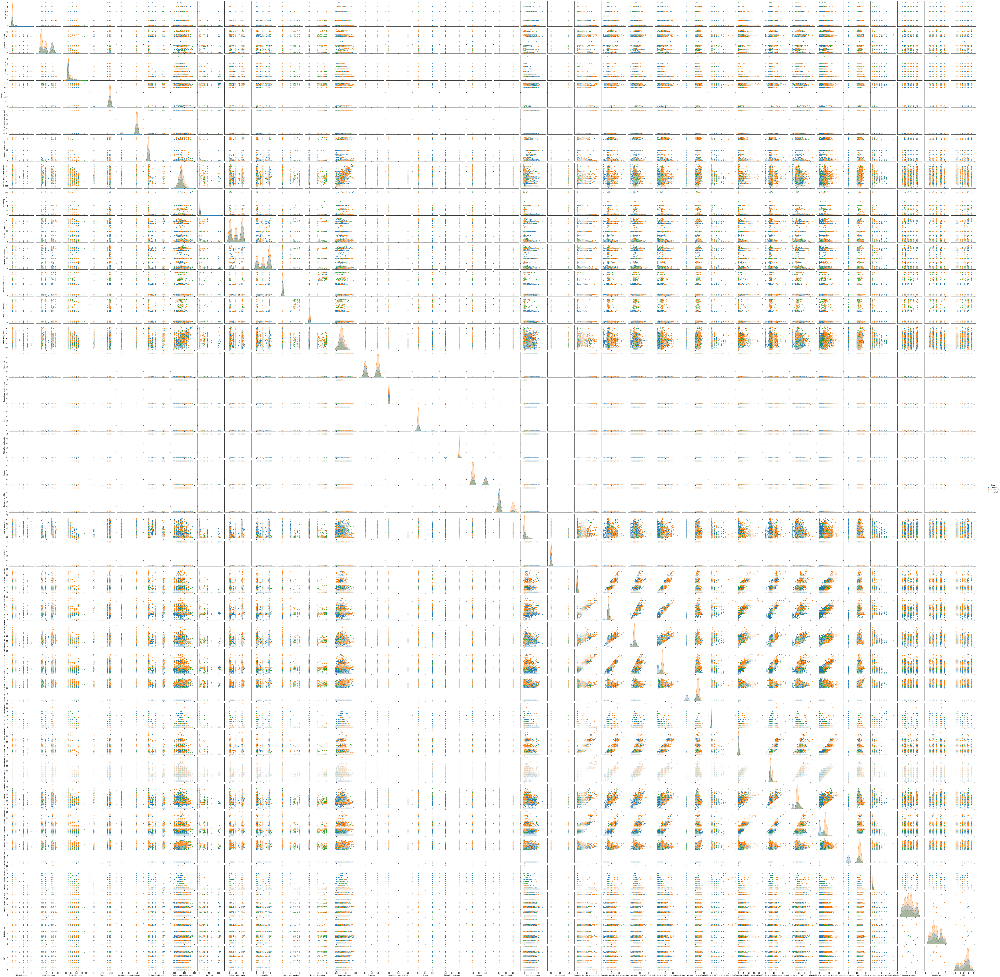

In [ ]:
sns.pairplot(data, hue="Target")

In [ ]:
#check for missing values on the dataset
data.isnull().sum()

Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance\t                      0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship holder                                0
Age at enrol

In [ ]:
#To check the classification type on the Target feature
data.Target.unique()

array(['Dropout', 'Graduate', 'Enrolled'], dtype=object)

In [ ]:
#To obtain the total number per classification
data['Target'].value_counts()

Graduate    2209
Dropout     1421
Enrolled     794
Name: Target, dtype: int64

In [ ]:
#Percentile view 
data['Target'].value_counts(normalize=True)*100

Graduate    49.932188
Dropout     32.120253
Enrolled    17.947559
Name: Target, dtype: float64

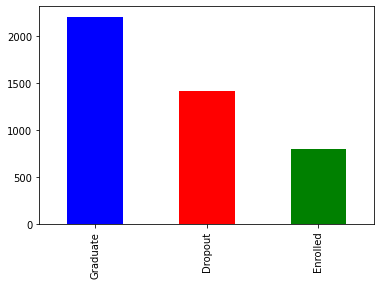

In [ ]:
#Bar chart representation of the Target variable
data["Target"].value_counts().plot(kind = "bar", color = ['blue', 'red', 'green'])
plt.show()

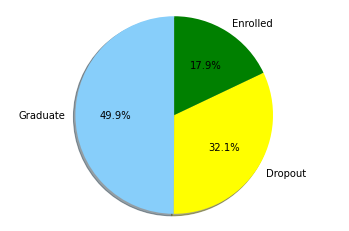

In [ ]:
#Pie Chart representation
labels = 'Graduate', 'Dropout', 'Enrolled'
sizes = [2209, 1421, 794]
colors=['lightskyblue','yellow','green']
fig1, ax1 = plt.subplots()
ax1.pie(sizes,  labels=labels, autopct='%1.1f%%',colors=colors,
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [ ]:
#Splitting the dataset

X = data.drop(['Target'],axis=1).values   # independant features
y = data['Target']       # dependant variable

#20% for the test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#perecentage of the test values
print(y_test.value_counts(normalize=True)*100)

Graduate    47.231638
Dropout     35.706215
Enrolled    17.062147
Name: Target, dtype: float64


# Stratified random sampling

Stratified random sampling is a method of sampling that involves the division of a population into smaller sub-groups known as strata

In [ ]:
#stratify=y indicates that the stratified random sampling was implemented 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

#perecentage of the test values after using stratified random sampling
print(y_test.value_counts(normalize=True)*100)

Graduate    49.943503
Dropout     32.090395
Enrolled    17.966102
Name: Target, dtype: float64


In [ ]:
print('X_train Shape: ',X_train.shape)
print('X_test Shape: ',X_test.shape)
print('y_train Shape: ',y_train.shape)
print('y_test Shape: ',y_test.shape)

X_train Shape:  (3539, 36)
X_test Shape:  (885, 36)
y_train Shape:  (3539,)
y_test Shape:  (885,)


# Classification ML models

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

# Random Forest

In [ ]:
#Random Forest Initialization without any parameters
rf_model = RandomForestClassifier()
#fit the model
rf_model.fit(X_train, y_train)

y_predicted = rf_model.predict(X_test)

# View the classification report for test data and predictions
print(classification_report(y_test, y_predicted))

#Confusion matrix
cm = confusion_matrix(y_test, y_predicted)
print('Confusion Matrix \n', cm)

              precision    recall  f1-score   support

     Dropout       0.80      0.75      0.78       284
    Enrolled       0.56      0.38      0.45       159
    Graduate       0.80      0.92      0.86       442

    accuracy                           0.77       885
   macro avg       0.72      0.68      0.69       885
weighted avg       0.76      0.77      0.76       885

Confusion Matrix 
 [[214  25  45]
 [ 41  60  58]
 [ 13  22 407]]


# Random Forest Hyperparameter Tuning

In [ ]:
#Parametes created for the Random Forest 
#First Parameter
rf_param_1 = {
    'n_estimators':[200, 500],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [4, 5, 6, 7, 8],
    'criterion': ['gini', 'entropy']
}

#Second Parameter
rf_param_2 = {
    'n_estimators': [int (x) for x in np.linspace(start = 10, stop = 80, num = 10)],
    'max_features': ['sqrt', 'log2']
}

#Third Parameter
rf_param_3 = {
    'n_estimators': [int (x) for x in np.linspace(start = 10, stop = 80, num = 10)],
    'max_features': ['sqrt'],
    'max_depth': [2,4],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1,2],
    'bootstrap': [True, False]
}

print('1st Parameter: ', rf_param_1)
print('\n2nd Parameter: ', rf_param_2)
print('\n3rd Parameter: ', rf_param_3)

1st Parameter:  {'n_estimators': [200, 500], 'max_features': ['sqrt', 'log2'], 'max_depth': [4, 5, 6, 7, 8], 'criterion': ['gini', 'entropy']}

2nd Parameter:  {'n_estimators': [10, 17, 25, 33, 41, 48, 56, 64, 72, 80], 'max_features': ['sqrt', 'log2']}

3rd Parameter:  {'n_estimators': [10, 17, 25, 33, 41, 48, 56, 64, 72, 80], 'max_features': ['sqrt'], 'max_depth': [2, 4], 'min_samples_split': [2, 5], 'min_samples_leaf': [1, 2], 'bootstrap': [True, False]}


# GridSearch CV

In [ ]:
#GridSearch CV for the three parameters
rf_grid_1 = GridSearchCV(estimator = rf_model, param_grid = rf_param_1, cv = 10, verbose = -1, n_jobs = 4)
rf_grid_2 = GridSearchCV(estimator = rf_model, param_grid = rf_param_2, cv = 10, verbose = -1, n_jobs = 4)
rf_grid_3 = GridSearchCV(estimator = rf_model, param_grid = rf_param_3, cv = 10, verbose = -1, n_jobs = 4)

#Fit the models
rf_grid_1.fit(X_train, y_train)
rf_grid_2.fit(X_train, y_train)
rf_grid_3.fit(X_train, y_train)

#Best parameter 
print('The Best Parameter for grid search 1 - ', rf_grid_1.best_params_)
print('The Best Parameter for grid search 2 - ', rf_grid_2.best_params_)
print('The Best Parameter for grid search 3 - ', rf_grid_3.best_params_)
print('\n')

#Best Score
print('The Best Scores for grid search 1 - ', rf_grid_1.best_score_)
print('The Best Scores for grid search 2 - ', rf_grid_2.best_score_)
print('The Best Scores for grid search 3 - ', rf_grid_3.best_score_)
print('\n')


#Best std
print('Best Standard Deviation Score for grid search 1 - ', rf_grid_1.cv_results_['std_test_score'][rf_grid_1.best_index_])
print('Best Standard Deviation Score for grid search 2 - ', rf_grid_2.cv_results_['std_test_score'][rf_grid_2.best_index_])
print('Best Standard Deviation Score for grid search 3 - ', rf_grid_3.cv_results_['std_test_score'][rf_grid_3.best_index_])

The Best Parameter for grid search 1 -  {'criterion': 'gini', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 200}
The Best Parameter for grid search 2 -  {'max_features': 'log2', 'n_estimators': 41}
The Best Parameter for grid search 3 -  {'bootstrap': True, 'max_depth': 4, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 80}


The Best Scores for grid search 1 -  0.7705574494646372
The Best Scores for grid search 2 -  0.7793113106384341
The Best Scores for grid search 3 -  0.7394735999743922


Best Standard Deviation Score for grid search 1 -  0.013813019620263309
Best Standard Deviation Score for grid search 2 -  0.022910264479170057
Best Standard Deviation Score for grid search 3 -  0.020175187874522167


Using the best parameter after tuning the Random Foreset 

In [ ]:
#Random Foreset using the best parameter after tuning

rf_model1 = RandomForestClassifier(criterion = 'gini', max_depth = 8, max_features = 'log2', n_estimators = 200)
rf_model1.fit(X_train, y_train)

rf_model2 = RandomForestClassifier(max_features = 'log2', n_estimators = 41)
rf_model2.fit(X_train, y_train)

rf_model3 = RandomForestClassifier(bootstrap = True, max_depth = 4, max_features = 'sqrt', min_samples_leaf = 2, min_samples_split = 2, n_estimators = 80)
rf_model3.fit(X_train, y_train)

y_predicted1 = rf_model1.predict(X_test)
y_predicted2 = rf_model2.predict(X_test)
y_predicted3 = rf_model3.predict(X_test)

# View the classification report for test data and predictions
print('Classification Report for RF Model 1 - \n', classification_report(y_test, y_predicted1))
print('\nClassification Report for RF Model 2 - \n', classification_report(y_test, y_predicted2))
print('\nClassification Report for RF Model 3 - \n', classification_report(y_test, y_predicted3))

Classification Report for RF Model 1 - 
               precision    recall  f1-score   support

     Dropout       0.80      0.77      0.78       284
    Enrolled       0.58      0.24      0.34       159
    Graduate       0.77      0.95      0.85       442

    accuracy                           0.76       885
   macro avg       0.72      0.65      0.66       885
weighted avg       0.74      0.76      0.74       885


Classification Report for RF Model 2 - 
               precision    recall  f1-score   support

     Dropout       0.78      0.71      0.74       284
    Enrolled       0.50      0.34      0.40       159
    Graduate       0.79      0.92      0.85       442

    accuracy                           0.75       885
   macro avg       0.69      0.66      0.67       885
weighted avg       0.73      0.75      0.74       885


Classification Report for RF Model 3 - 
               precision    recall  f1-score   support

     Dropout       0.74      0.81      0.77       284
    

# Support Vector Machine 

In [ ]:
#SVM fitting
svm_model = SVC()
svm_model.fit(X_train, y_train)

print('Accuracy on testing data: \t', svm_model.score(X_test, y_test))
print('Accuracy on training data: \t', svm_model.score(X_train, y_train))

Accuracy on testing data: 	 0.4994350282485876
Accuracy on training data: 	 0.4992935857586889


In [ ]:
#Support Vector Machine with GridSearchCV

svm_param = [
             {'C':[1, 10, 100, 1000], 'kernel':['linear']},
             {'C':[1, 10, 100, 1000], 'kernel':['rbf'], 'gamma':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]}
            ]

svm_grid = GridSearchCV(SVC(), param_grid=svm_param, cv=10, scoring = 'accuracy', n_jobs = -1)
svm_grid.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=SVC(), n_jobs=-1,
             param_grid=[{'C': [1, 10, 100, 1000], 'kernel': ['linear']},
                         {'C': [1, 10, 100, 1000],
                          'gamma': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8,
                                    0.9],
                          'kernel': ['rbf']}],
             scoring='accuracy')

In [ ]:
#Best parameter 
print('The Best Parameter for grid search - ', svm_grid.best_params_)

#Best Score
print('The Best Scores for grid search - ', svm_grid.best_score_)

#Best std
print('Best Standard Deviation Score for grid search - ', svm_grid.cv_results_['std_test_score'][svm_grid.best_index_])

The Best Parameter for grid search -  {'C': 1, 'kernel': 'linear'}
The Best Scores for grid search -  0.7578359821385702
Best Standard Deviation Score for grid search -  0.02008323563244171


In [ ]:
#Support Vector Machine Hypertuning 


svm_model1 = SVC(C = 1, kernel = 'linear')
svm_model1.fit(X_train, y_train)

SVC(C=1, kernel='linear')

In [ ]:
#Confusion Metrics for Improved SVM

y_predicted_svm = svm_model1.predict(X_test)

cm_svm = confusion_matrix(y_test, y_predicted_svm)
cm_svm

array([[226,  19,  39],
       [ 54,  33,  72],
       [ 13,  18, 411]], dtype=int64)

In [ ]:
# View the classification report for test data and predictions for improved SVM
print(classification_report(y_test, y_predicted_svm))

              precision    recall  f1-score   support

     Dropout       0.77      0.80      0.78       284
    Enrolled       0.47      0.21      0.29       159
    Graduate       0.79      0.93      0.85       442

    accuracy                           0.76       885
   macro avg       0.68      0.64      0.64       885
weighted avg       0.73      0.76      0.73       885



# K-Nearest Neighbor.

In [ ]:
#KNN
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)

#Test and Training Acccuracy

print('Accuracy on testing data: \t', knn_model.score(X_test, y_test))
print('Accuracy on training data: \t', knn_model.score(X_train, y_train))

Accuracy on testing data: 	 0.5774011299435028
Accuracy on training data: 	 0.7230856174060469


KNN Hyperparameter Tuning

In [ ]:
k_range = list(range(1, 31))
knn_param_grid = dict(n_neighbors=k_range)
  
# defining parameter range
grid = GridSearchCV(knn_model, param_grid=knn_param_grid, cv=10, scoring='accuracy', return_train_score=False,verbose=-1)
  
# fitting the model for grid search
grid_search=grid.fit(X_train, y_train)

In [ ]:
#Best parameter 
print('The Best Parameter for grid search - ', grid_search.best_params_)

#Best Score
print('The Best Scores for grid search - ', grid_search.best_score_)

#Best std
print('Best Standard Deviation Score for grid search - ', grid_search.cv_results_['std_test_score'][grid_search.best_index_])

The Best Parameter for grid search -  {'n_neighbors': 17}
The Best Scores for grid search -  0.6188161201005105
Best Standard Deviation Score for grid search -  0.016312460967284635


In [ ]:
#Tune parameter

knn = KNeighborsClassifier(n_neighbors=17)

knn.fit(X_train, y_train)

y_test_hat=knn.predict(X_test) 

test_accuracy=accuracy_score(y_test,y_test_hat)*100

print("Accuracy for our testing dataset with tuning is : {:.2f}%".format(test_accuracy) )

Accuracy for our testing dataset with tuning is : 61.24%


In [ ]:
#Confusion matrix

cm_knn = confusion_matrix(y_test,y_test_hat)
cm_knn

array([[142,  15, 127],
       [ 48,  20,  91],
       [ 34,  28, 380]], dtype=int64)

In [ ]:
#Classification Report
print(classification_report(y_test,y_test_hat))

              precision    recall  f1-score   support

     Dropout       0.63      0.50      0.56       284
    Enrolled       0.32      0.13      0.18       159
    Graduate       0.64      0.86      0.73       442

    accuracy                           0.61       885
   macro avg       0.53      0.50      0.49       885
weighted avg       0.58      0.61      0.58       885

